In [24]:
from matplotlib.colors import ListedColormap
from matplotlib import pyplot as plt
from sklearn.manifold import TSNE
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
from sklearn.cluster import KMeans
from sklearn.metrics.pairwise import cosine_similarity

In [25]:
path = r"IR-Newspapers-files-16.12\IR-Newspapers-files\IR-files"
labels_list = {'A-J' : 0, 'BBC' : 1, 'J-P' : 2, 'NY-T' : 3}

In [33]:
def apply_kmeans(X, y_true, name):
    """
    Perform KMeans clustering using cosine similarity and evaluate the results.

    Parameters:
    - X: ndarray, feature matrix.
    - y_true: ndarray, ground truth labels.
    - name: str, name of the dataset or clustering task.
    """
    
    # Step 1: Calculate cosine similarity matrix
    similarity_matrix = cosine_similarity(X)

    # Step 2: Perform KMeans clustering
    kmeans = KMeans(n_clusters=4, random_state=42, n_init="auto")
    y_pred_kmeans = kmeans.fit_predict(similarity_matrix)

    # Step 3: Evaluate clustering results
    precision = precision_score(y_true, y_pred_kmeans, average='macro', zero_division=1)
    recall = recall_score(y_true, y_pred_kmeans, average='macro', zero_division=1)
    f1 = f1_score(y_true, y_pred_kmeans, average='macro', zero_division=1)
    accuracy = accuracy_score(y_true, y_pred_kmeans)

    print(f"{name} Results:")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1 Score: {f1:.4f}")
    print(f"Accuracy: {accuracy:.4f}")

    # Step 4: Visualize clustering with t-SNE
    tsne = TSNE(n_components=2, random_state=42)
    embedding_tsne = tsne.fit_transform(X)

    distinct_colors = ['#2ca02c', '#d62728', '#9467bd', '#8c564b']
    cmap = ListedColormap(distinct_colors[:len(labels_list)])

    plt.figure(figsize=(8, 6))
    scatter = plt.scatter(
        embedding_tsne[:, 0], 
        embedding_tsne[:, 1], 
        c=y_pred_kmeans, 
        cmap=cmap, 
        s=10
    )
    plt.title(f'{name} Clustering')
    plt.xlabel('t-SNE Dimension 1')
    plt.ylabel('t-SNE Dimension 2')

    # Step 5: Add legend with custom cluster labels
    inverse_labels_list = {v: k for k, v in labels_list.items()}
    unique_labels = set(y_pred_kmeans)
    handles = [
        plt.Line2D([0], [0], marker='o', color=distinct_colors[label % len(distinct_colors)], 
                   linestyle='', markersize=8, label=inverse_labels_list[label])
        for label in unique_labels
    ]
    plt.legend(handles=handles, title="Clusters")
    plt.show()

In [34]:
import pandas as pd
import os

def process_all_matrices(classifier):
    for dir in os.listdir(path):
        if dir == 'TF-IDF':
            clean_matrices = []
            lemma_matrices = []
            for file in sorted(os.listdir(f'{path}\\{dir}')):
                if 'clean' in file:
                    clean_matrices.append(pd.read_excel(f'{path}\\{dir}\\{file}').drop(columns=['DocumentIndex']))
                elif 'lemma' in file:
                    lemma_matrices.append(pd.read_excel(f'{path}\\{dir}\\{file}').drop(columns=['DocumentIndex']))

            shapes = [i.shape[0] for i in clean_matrices]

            y = []
            for i, j in enumerate(shapes):
                y = y + [i] * j

            clean_df = pd.concat(clean_matrices, ignore_index=True)
            lemma_df = pd.concat(lemma_matrices, ignore_index=True)

            print(f'{"-"*15}TF-IDF clean{"-"*15}')
            classifier(clean_df, y,'TF-IDF clean')
            print(f'{"-"*15}TF-IDF lemma{"-"*15}')
            classifier(lemma_df, y, 'TF-IDF lemma')

        else:
            for matrix in os.listdir(f'{path}\\{dir}'):
                df = pd.read_csv(f'{path}\\{dir}\\{matrix}')
                y = df['Sheet'].map(labels_list)
                df.drop(['RowIndex', 'Sheet'], axis=1, inplace=True)
                print(f'{"-"*15}{matrix}{"-"*15}')
                classifier(df, y, matrix)

---------------bert_withIDF.csv---------------
bert_withIDF.csv Results:
Precision: 0.0543
Recall: 0.0510
F1 Score: 0.0515
Accuracy: 0.0520


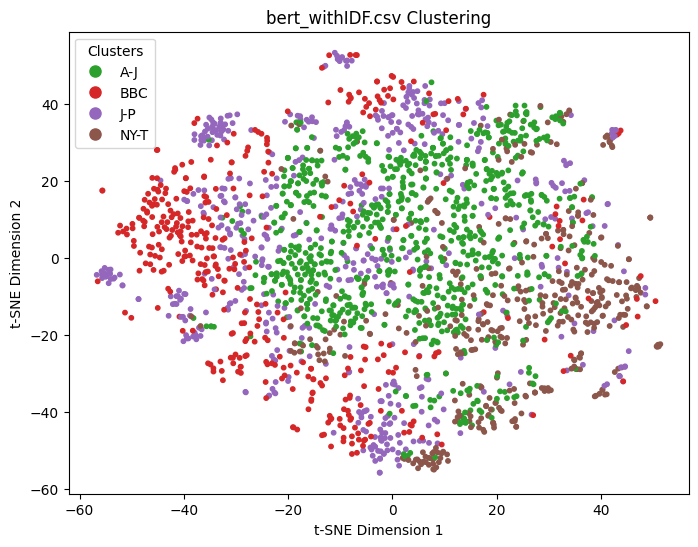

---------------bert_withoutIDF.csv---------------
bert_withoutIDF.csv Results:
Precision: 0.0379
Recall: 0.0322
F1 Score: 0.0337
Accuracy: 0.0328


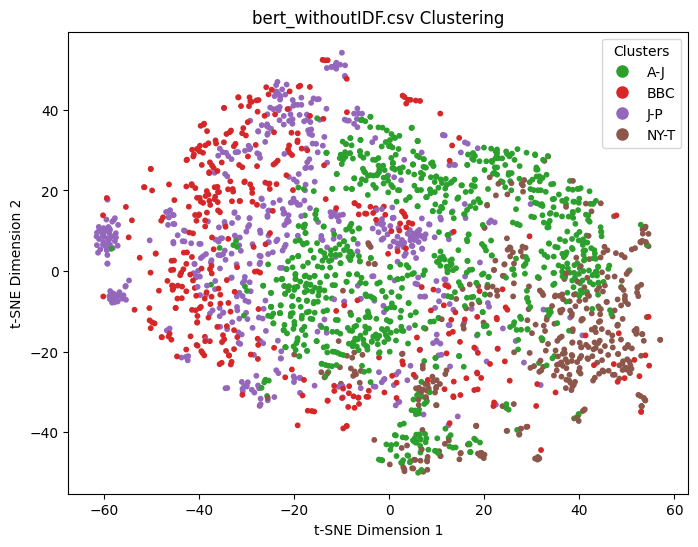

---------------sbert_vectors.csv---------------
sbert_vectors.csv Results:
Precision: 0.2551
Recall: 0.2008
F1 Score: 0.2068
Accuracy: 0.2020


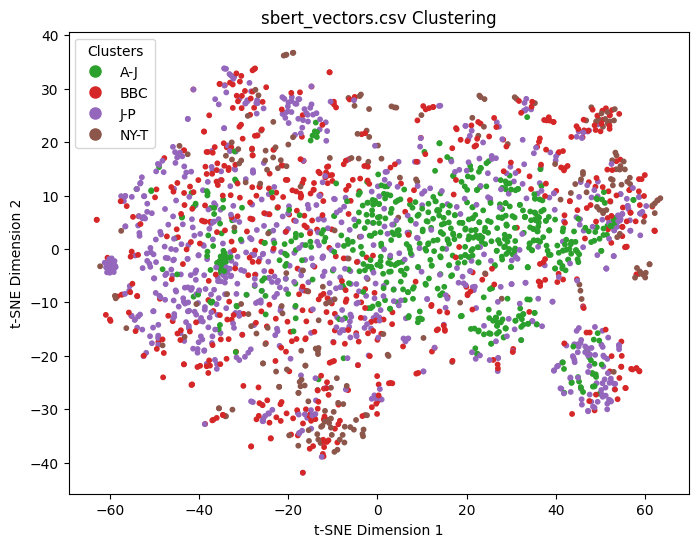

---------------doc2vec_vectors.csv---------------
doc2vec_vectors.csv Results:
Precision: 0.1848
Recall: 0.1806
F1 Score: 0.1818
Accuracy: 0.1837


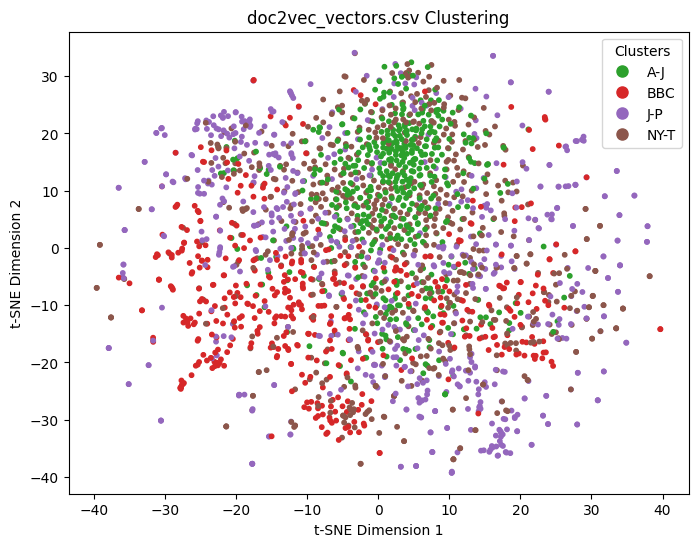

---------------glove_clean_withIDF_withoutStopWords.csv---------------
glove_clean_withIDF_withoutStopWords.csv Results:
Precision: 0.3000
Recall: 0.1660
F1 Score: 0.1720
Accuracy: 0.1692


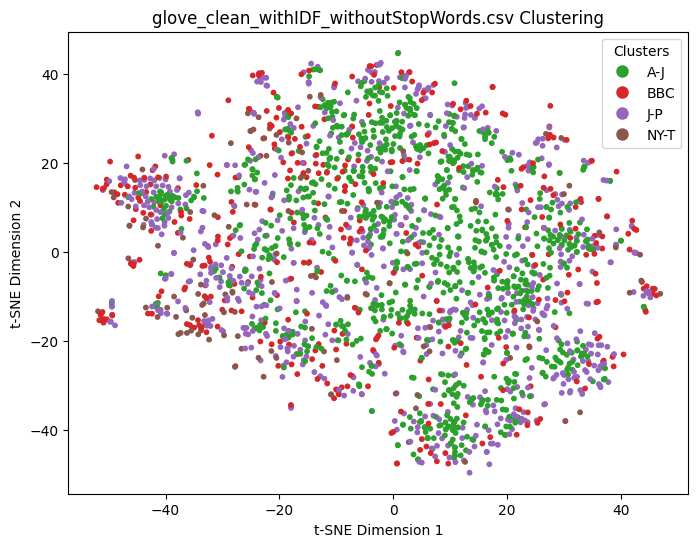

---------------glove_clean_withIDF_withStopWords.csv---------------
glove_clean_withIDF_withStopWords.csv Results:
Precision: 0.2983
Recall: 0.1693
F1 Score: 0.1802
Accuracy: 0.1726


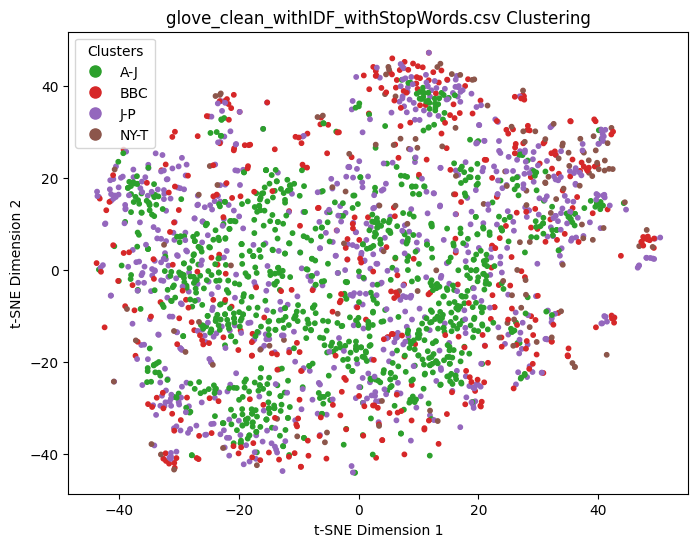

---------------glove_clean_withoutIdf_withoutStopWords.csv---------------
glove_clean_withoutIdf_withoutStopWords.csv Results:
Precision: 0.3238
Recall: 0.1654
F1 Score: 0.1600
Accuracy: 0.1688


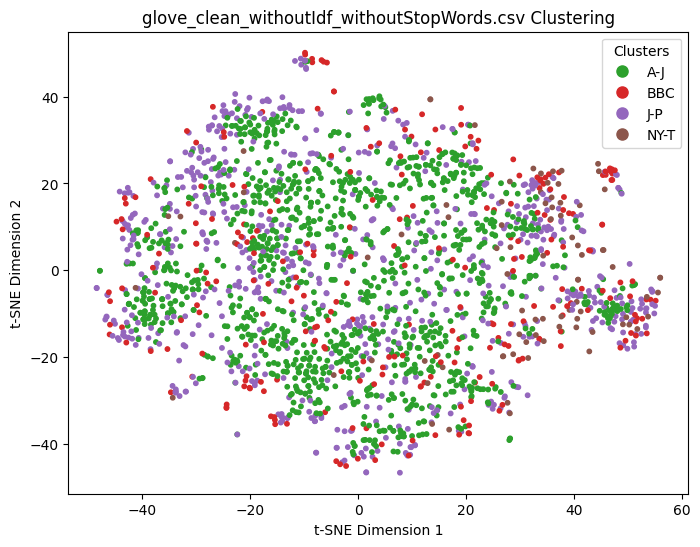

---------------glove_clean_withoutIdf_withStopWords.csv---------------
glove_clean_withoutIdf_withStopWords.csv Results:
Precision: 0.2962
Recall: 0.1002
F1 Score: 0.1039
Accuracy: 0.1023


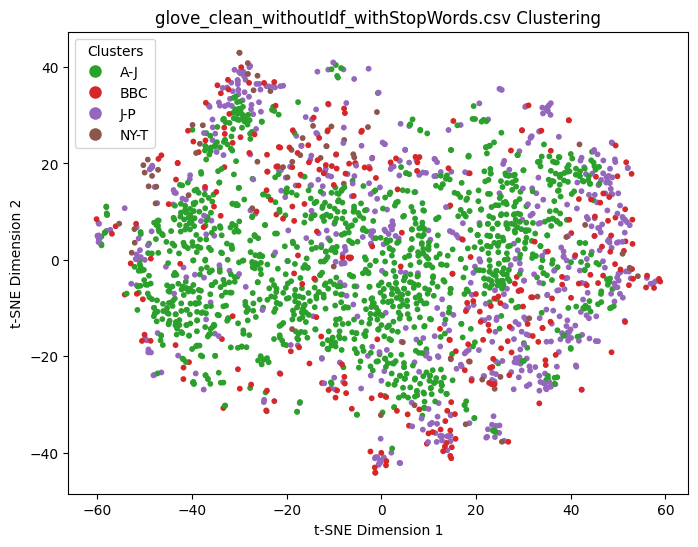

---------------glove_lemma_withIDF_withoutStopWords.csv---------------
glove_lemma_withIDF_withoutStopWords.csv Results:
Precision: 0.3045
Recall: 0.1693
F1 Score: 0.1734
Accuracy: 0.1726


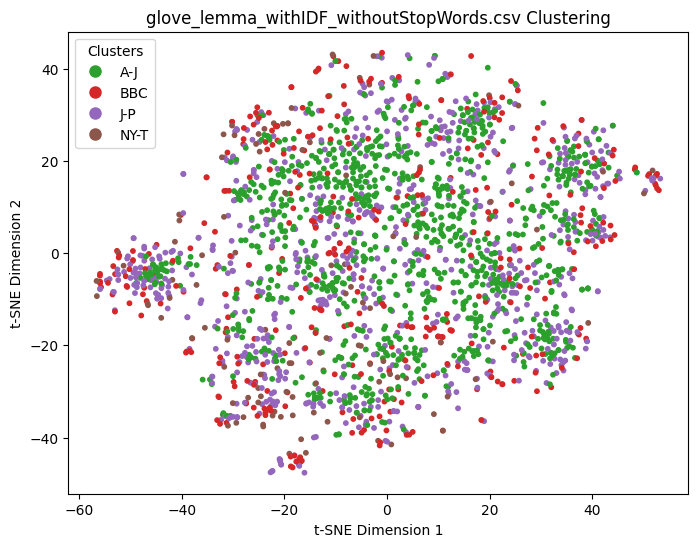

---------------glove_lemma_withIDF_withStopWords.csv---------------
glove_lemma_withIDF_withStopWords.csv Results:
Precision: 0.0974
Recall: 0.1136
F1 Score: 0.1015
Accuracy: 0.1159


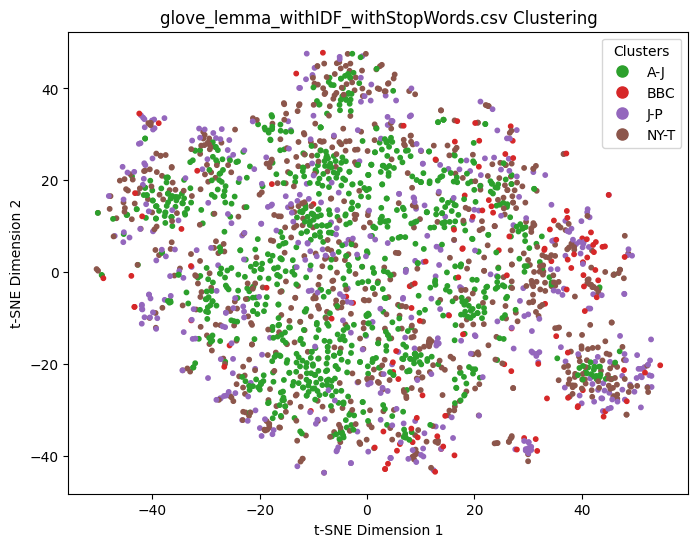

---------------glove_lemma_withoutIdf_withoutStopWords.csv---------------
glove_lemma_withoutIdf_withoutStopWords.csv Results:
Precision: 0.1178
Recall: 0.1536
F1 Score: 0.1243
Accuracy: 0.1569


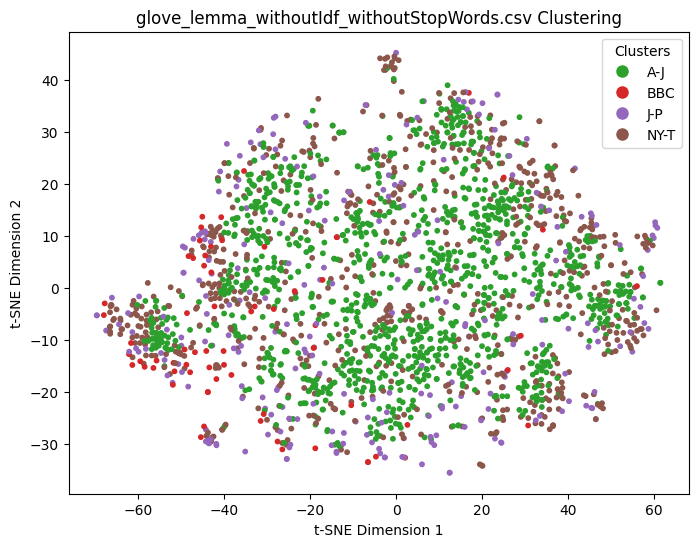

---------------glove_lemma_withoutIdf_withStopWords.csv---------------
glove_lemma_withoutIdf_withStopWords.csv Results:
Precision: 0.3034
Recall: 0.1328
F1 Score: 0.0835
Accuracy: 0.1355


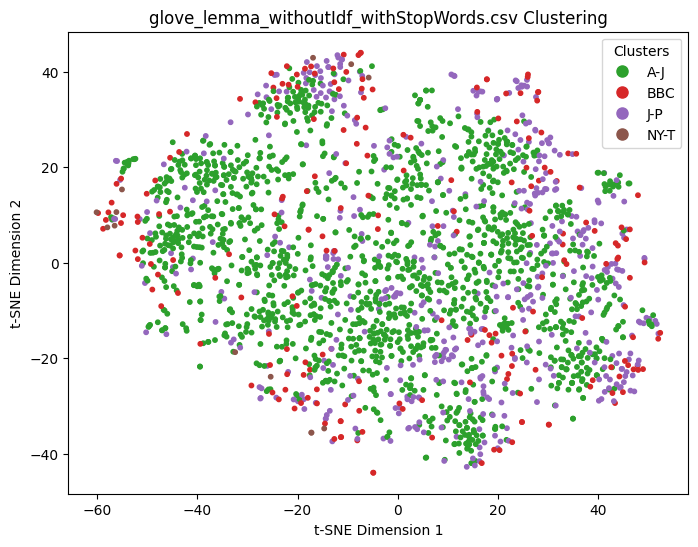

---------------TF-IDF clean---------------
TF-IDF clean Results:
Precision: 0.2947
Recall: 0.2863
F1 Score: 0.2891
Accuracy: 0.2856


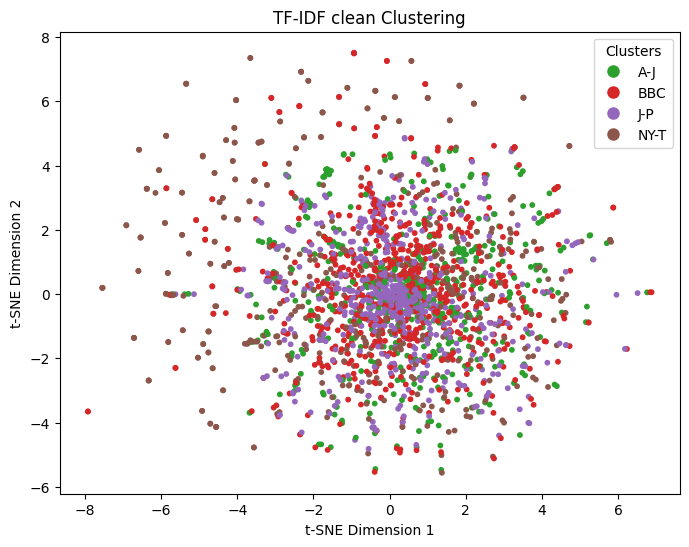

---------------TF-IDF lemma---------------
TF-IDF lemma Results:
Precision: 0.0966
Recall: 0.1119
F1 Score: 0.1037
Accuracy: 0.1142


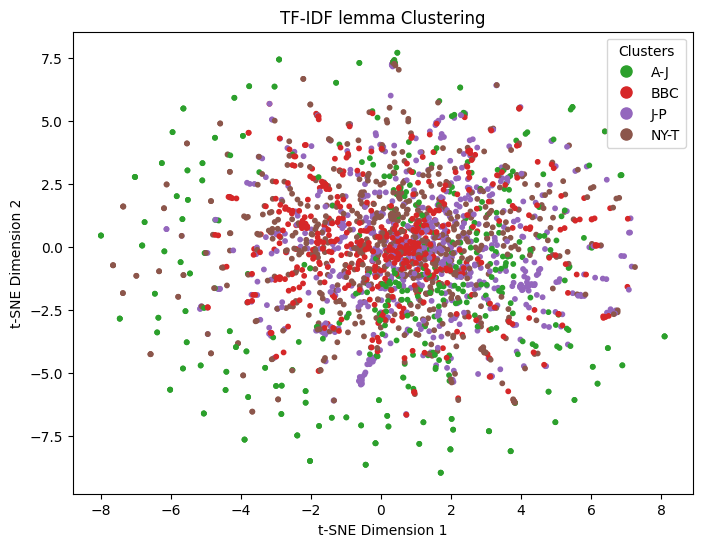

---------------w2v_clean_withIDF_withoutStopWords.csv---------------
w2v_clean_withIDF_withoutStopWords.csv Results:
Precision: 0.1871
Recall: 0.2095
F1 Score: 0.1952
Accuracy: 0.2140


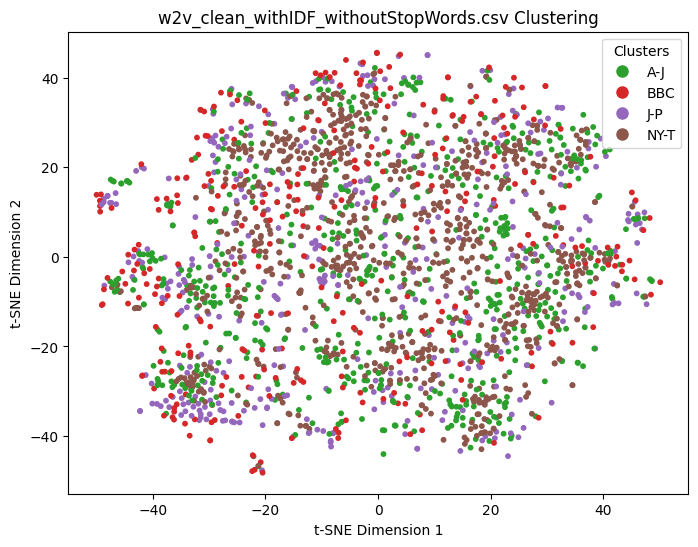

---------------w2v_clean_withIDF_withStopWords.csv---------------
w2v_clean_withIDF_withStopWords.csv Results:
Precision: 0.0540
Recall: 0.0476
F1 Score: 0.0500
Accuracy: 0.0486


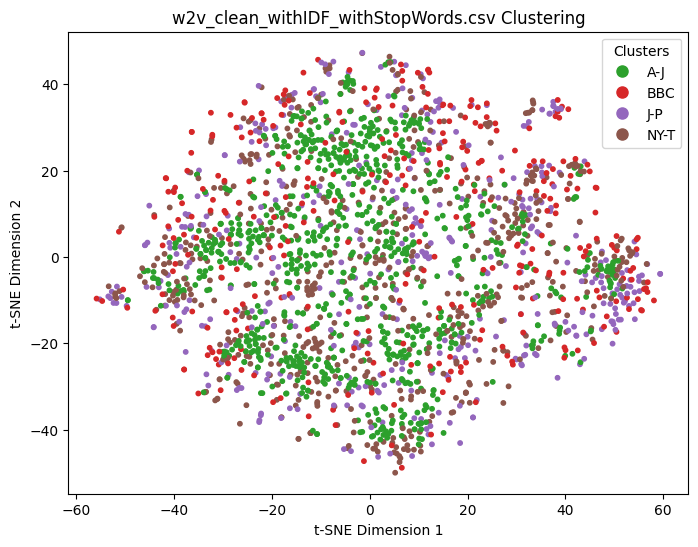

---------------w2v_clean_withoutIdf_withoutStopWords.csv---------------
w2v_clean_withoutIdf_withoutStopWords.csv Results:
Precision: 0.0629
Recall: 0.0643
F1 Score: 0.0626
Accuracy: 0.0656


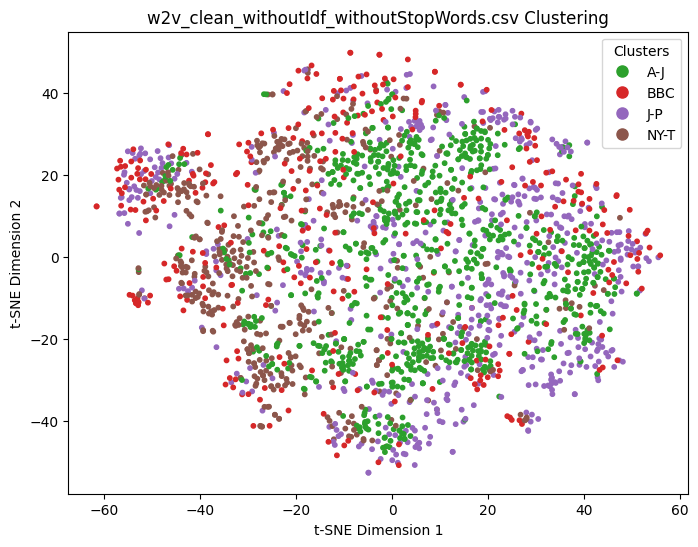

---------------w2v_clean_withoutIdf_withStopWords.csv---------------
w2v_clean_withoutIdf_withStopWords.csv Results:
Precision: 0.2954
Recall: 0.1315
F1 Score: 0.1656
Accuracy: 0.1343


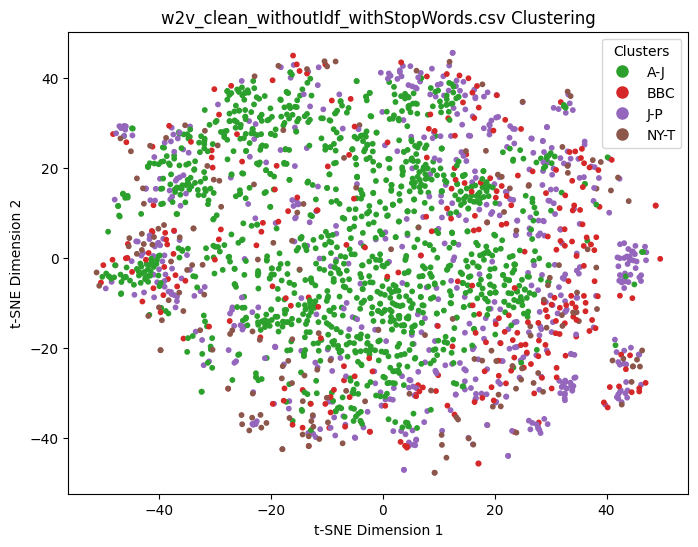

---------------w2v_lemma_withIDF_withoutStopWords.csv---------------
w2v_lemma_withIDF_withoutStopWords.csv Results:
Precision: 0.0448
Recall: 0.0401
F1 Score: 0.0416
Accuracy: 0.0409


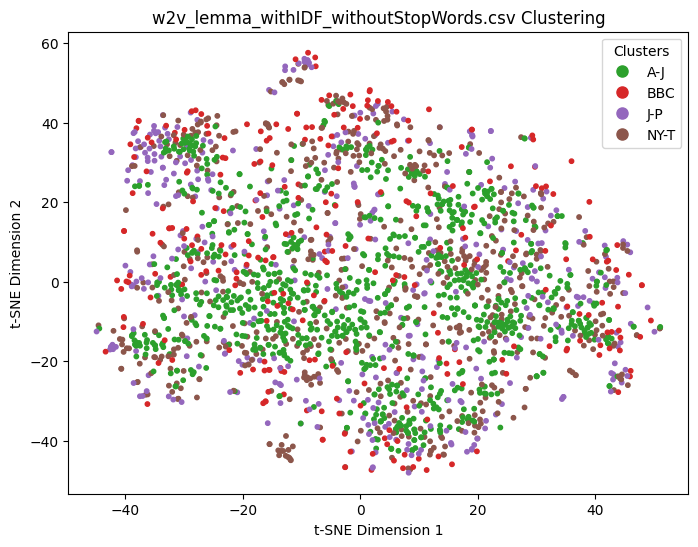

---------------w2v_lemma_withIDF_withStopWords.csv---------------
w2v_lemma_withIDF_withStopWords.csv Results:
Precision: 0.0451
Recall: 0.0405
F1 Score: 0.0419
Accuracy: 0.0413


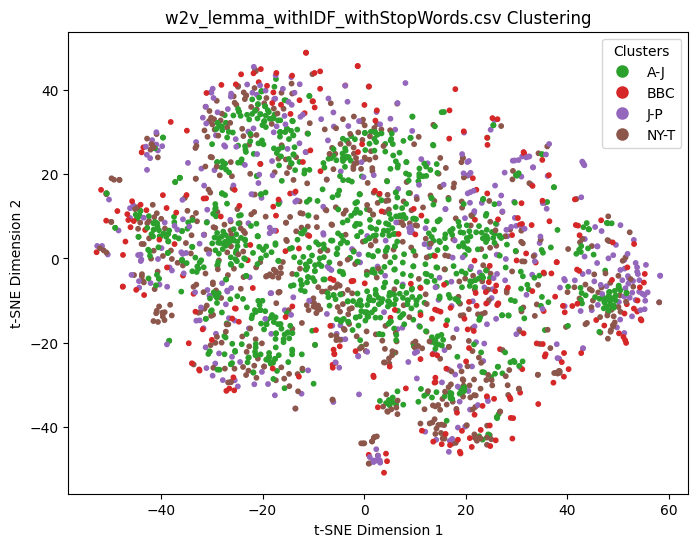

---------------w2v_lemma_withoutIdf_withoutStopWords.csv---------------
w2v_lemma_withoutIdf_withoutStopWords.csv Results:
Precision: 0.3112
Recall: 0.1495
F1 Score: 0.1750
Accuracy: 0.1526


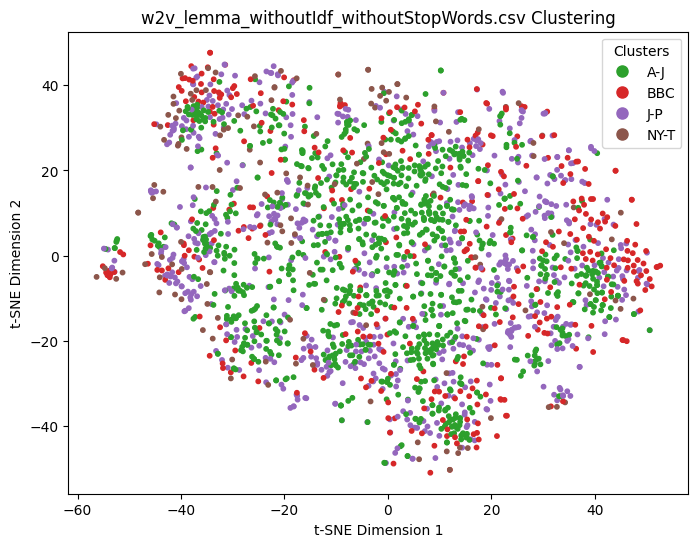

---------------w2v_lemma_withoutIdf_withStopWords.csv---------------
w2v_lemma_withoutIdf_withStopWords.csv Results:
Precision: 0.2922
Recall: 0.1232
F1 Score: 0.1533
Accuracy: 0.1257


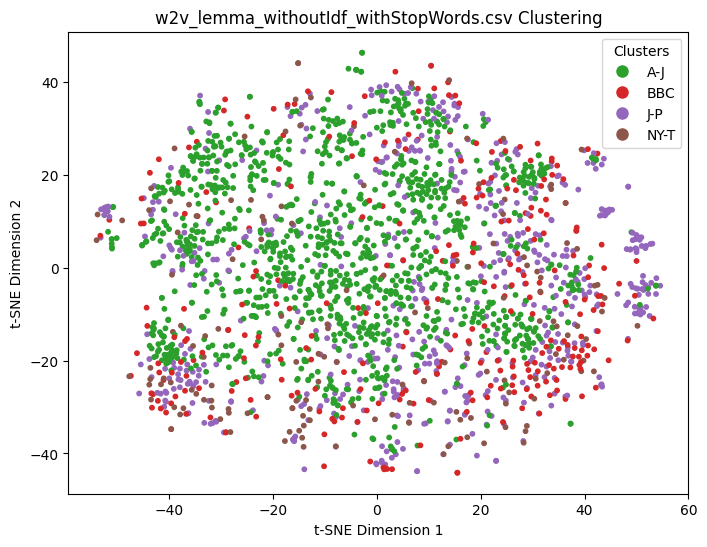

In [35]:
process_all_matrices(apply_kmeans)

In [36]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import pairwise_distances, precision_score, recall_score, f1_score, accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
from scipy.sparse.csgraph import minimum_spanning_tree
from matplotlib.colors import ListedColormap
import matplotlib.pyplot as plt
import numpy as np

In [59]:
def calc_dbscan(X, y_true, name):
    """
    Perform DBSCAN clustering on the given data, evaluate the results using standard metrics,
    and visualize the clusters with t-SNE.

    Parameters:
    ----------
    X : ndarray
        The input feature matrix (n_samples x n_features).
    y_true : ndarray
        The ground truth labels for evaluation.
    name : str
        The name of the dataset or clustering task for visualization purposes.

    Process:
    -------
    1. Standardize the input data using StandardScaler to normalize feature ranges.
    2. Calculate pairwise distances between samples using cosine similarity.
    3. Construct the Minimum Spanning Tree (MST) from the distance matrix.
    4. Use the largest edge weight of the MST as the DBSCAN epsilon value.
    5. Set the number of clusters and calculate the `min_samples` for DBSCAN dynamically.
    6. Perform DBSCAN clustering on the standardized data.
    7. Evaluate clustering results using:
       - Precision
       - Recall
       - F1 Score
       - Accuracy
    8. Visualize the clusters using t-SNE and assign distinct colors to each cluster.
    9. Add a legend to the plot based on the custom cluster labels provided by `labels_list`.

    Notes:
    ------
    - DBSCAN is density-based, and the clustering results may vary depending on the dataset.
    - Noise points, labeled as `-1`, are not explicitly handled in this code.
    - Ensure that `labels_list` is defined and matches the expected cluster IDs.

    Returns:
    -------
    None
        The function does not return any values but prints evaluation metrics and displays a t-SNE visualization.

    Metrics:
    -------
    Precision : Measures the proportion of true positives among predicted positives.
    Recall : Measures the proportion of true positives among all actual positives.
    F1 Score : Harmonic mean of precision and recall.
    Accuracy : Measures the proportion of correctly classified samples.

    Visualization:
    --------------
    - The clusters are visualized in 2D space using t-SNE for dimensionality reduction.
    - Each cluster is assigned a distinct color from `distinct_colors`.
    - A legend is added with custom labels defined in `labels_list`.

    Example Usage:
    --------------
    labels_list = {'A-J': 0, 'BBC': 1, 'J-P': 2, 'NY-T': 3}
    calc_dbscan(X, y_true, "My Dataset")
    """
    # Standardize the data
    X_standardized = StandardScaler().fit_transform(X)

    # Calculate pairwise distances
    distances = pairwise_distances(X_standardized)

    # Construct the MST
    mst = minimum_spanning_tree(distances).toarray()  # Ensure dense array

    # Extract the largest edge weight as epsilon
    eps = np.max(mst[mst > 0])

    # Set min_samples as before
    n_clusters = 4
    average_samples_per_cluster = X.shape[0] / n_clusters
    min_samples = int(0.5 * average_samples_per_cluster)

    # Perform DBSCAN clustering
    dbscan = DBSCAN(eps=0.35, min_samples=12, metric='cosine')
    dbscan_labels = dbscan.fit_predict(X_standardized)

    # Evaluate the clustering results for DBSCAN
    precision = precision_score(y_true, dbscan_labels, average='macro', zero_division=1)
    recall = recall_score(y_true, dbscan_labels, average='macro', zero_division=1)
    f1 = f1_score(y_true, dbscan_labels, average='macro', zero_division=1)
    accuracy = accuracy_score(y_true, dbscan_labels)

    print(f"Precision: {precision}")
    print(f"Recall: {recall}")
    print(f"F1 Score: {f1}")
    print(f"Accuracy: {accuracy}")

    tsne = TSNE(n_components=2, random_state=42)
    embedding_tsne = tsne.fit_transform(X)

    distinct_colors = ['#2ca02c', '#d62728', '#9467bd', '#8c564b']
    cmap = ListedColormap(distinct_colors[:len(set(dbscan_labels))])

    plt.scatter(embedding_tsne[:, 0], embedding_tsne[:, 1], c=dbscan_labels, cmap=cmap, s=10)
    plt.title(f'{name} Clustering')

    # Add legend with cluster labels
    cluster_labels = labels_list.keys()
    handles = [plt.Line2D([0], [0], marker='o', color=distinct_colors[i % len(distinct_colors)], linestyle='', markersize=8, label=label)
               for i, label in enumerate(cluster_labels)]
    plt.legend(handles=handles, title="Clusters")

    plt.show()


---------------bert_withIDF.csv---------------
Precision: 0.13861386138613863
Recall: 0.5131469115191987
F1 Score: 0.021070029857691262
Accuracy: 0.026854219948849106


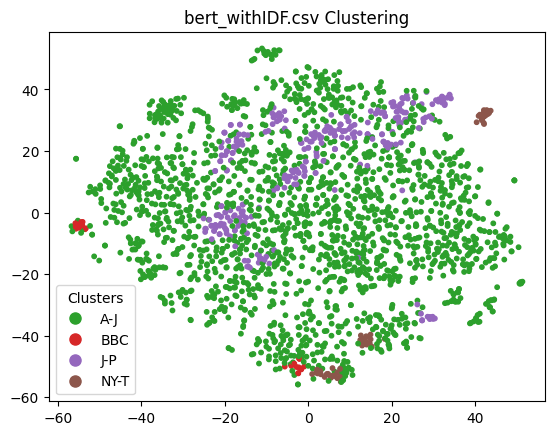

---------------bert_withoutIDF.csv---------------
Precision: 0.1344632768361582
Recall: 0.5705805972917826
F1 Score: 0.02224345933214116
Accuracy: 0.034526854219948847


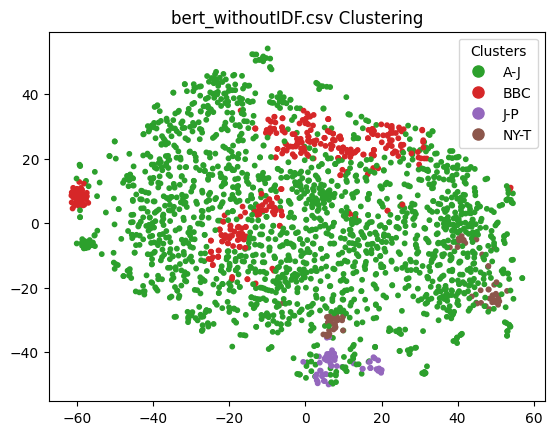

---------------sbert_vectors.csv---------------
Precision: 0.4821630347054076
Recall: 0.37696160267111856
F1 Score: 0.12432096598687212
Accuracy: 0.2259164535379369


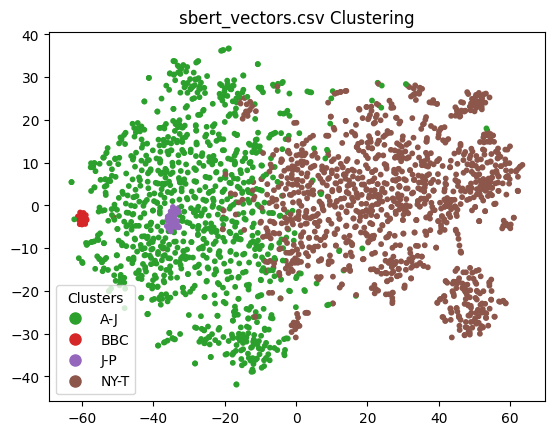

---------------doc2vec_vectors.csv---------------
Precision: 0.6118993135011441
Recall: 0.20868113522537562
F1 Score: 0.010038610038610039
Accuracy: 0.011082693947144074


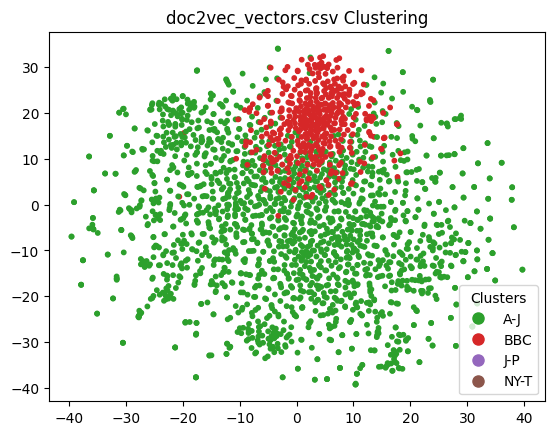

---------------glove_clean_withIDF_withoutStopWords.csv---------------
Precision: 0.11646678723989605
Recall: 0.603739822729578
F1 Score: 0.058979410010713176
Accuracy: 0.10272804774083547


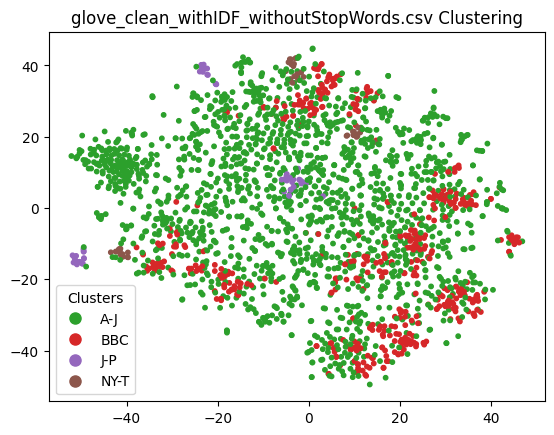

---------------glove_clean_withIDF_withStopWords.csv---------------
Precision: 0.1407661782661783
Recall: 0.6019342093126269
F1 Score: 0.06387984494554348
Accuracy: 0.10017050298380221


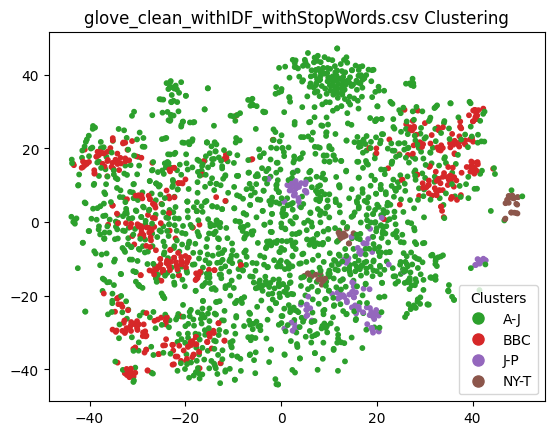

---------------glove_clean_withoutIdf_withoutStopWords.csv---------------
Precision: 0.48578915843066783
Recall: 0.2585827624060745
F1 Score: 0.05579736670121469
Accuracy: 0.07459505541346974


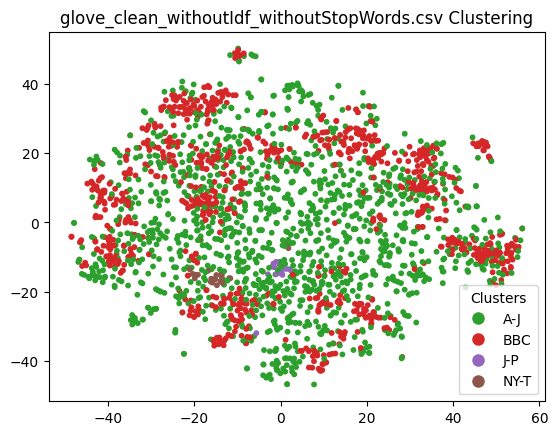

---------------glove_clean_withoutIdf_withStopWords.csv---------------
Precision: 0.06752508765566437
Recall: 0.35382234912873406
F1 Score: 0.018586320874650394
Accuracy: 0.03111679454390452


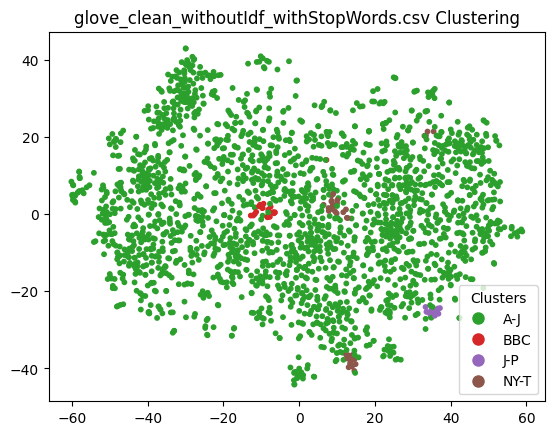

---------------glove_lemma_withIDF_withoutStopWords.csv---------------
Precision: 0.08003601128601129
Recall: 0.7035975844098671
F1 Score: 0.019426683595632717
Accuracy: 0.036231884057971016


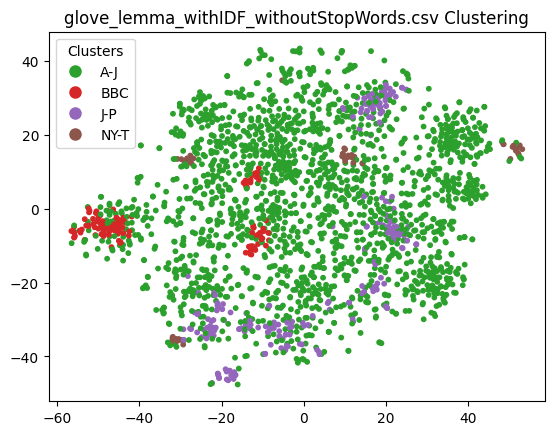

---------------glove_lemma_withIDF_withStopWords.csv---------------
Precision: 0.08279285633307683
Recall: 0.6176371669844398
F1 Score: 0.027698334197377862
Accuracy: 0.042625745950554135


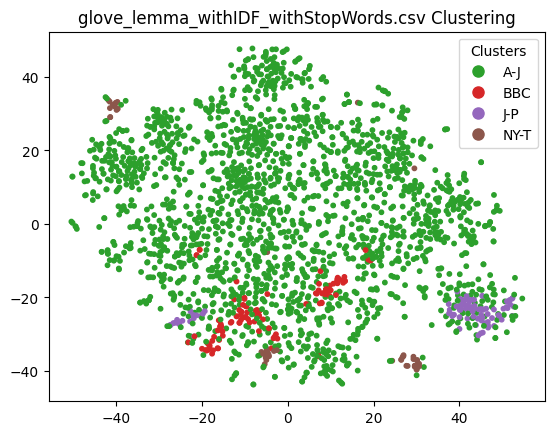

---------------glove_lemma_withoutIdf_withoutStopWords.csv---------------
Precision: 0.09065985397263425
Recall: 0.37916766762657456
F1 Score: 0.039832045175495066
Accuracy: 0.06990622335890878


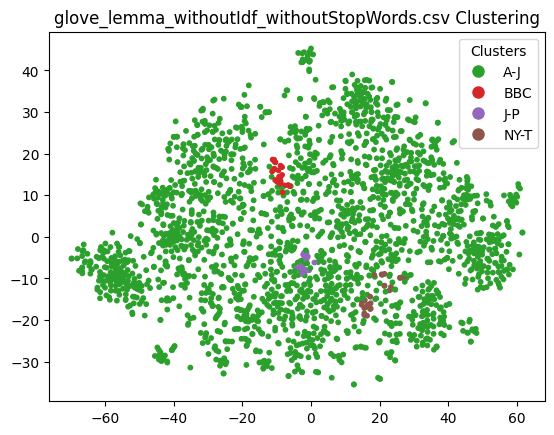

---------------glove_lemma_withoutIdf_withStopWords.csv---------------
Precision: 0.415695067264574
Recall: 0.22337228714524207
F1 Score: 0.018779342723004695
Accuracy: 0.029838022165387893


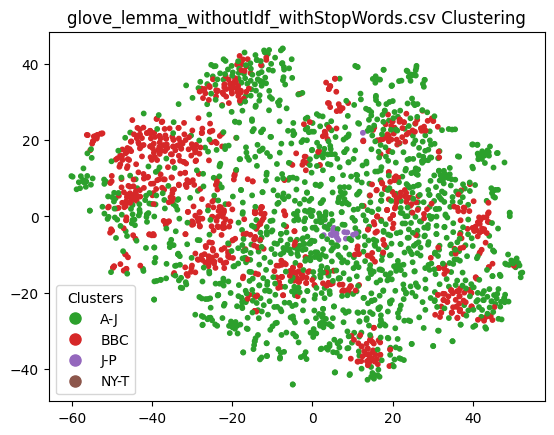

---------------TF-IDF clean---------------
Precision: 0.8
Recall: 0.2
F1 Score: 0.0
Accuracy: 0.0


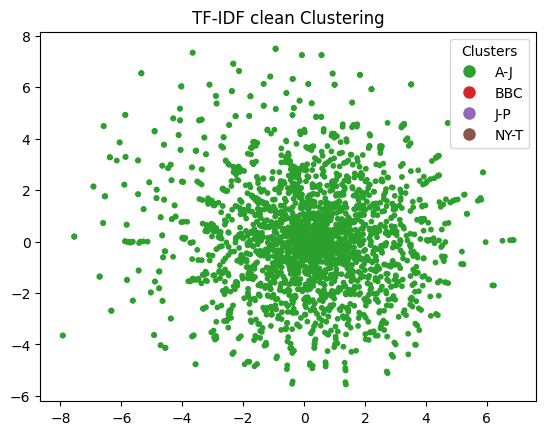

---------------TF-IDF lemma---------------
Precision: 0.8
Recall: 0.2
F1 Score: 0.0
Accuracy: 0.0


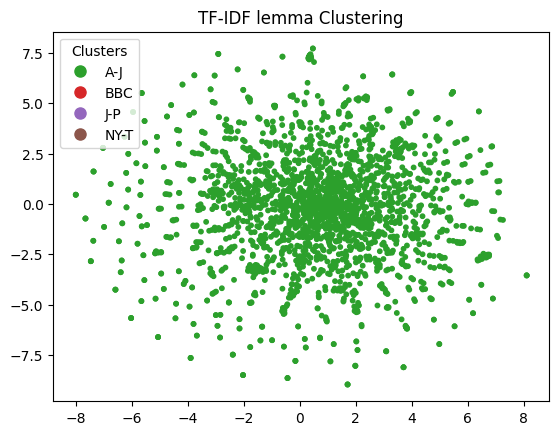

---------------w2v_clean_withIDF_withoutStopWords.csv---------------
Precision: 0.0814064421491477
Recall: 0.7019166735086712
F1 Score: 0.01650087967829675
Accuracy: 0.030264279624893437


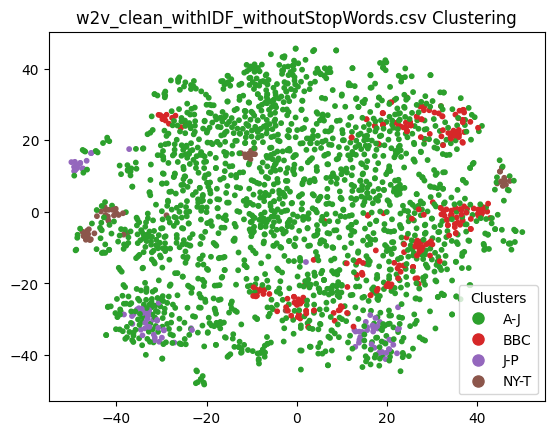

---------------w2v_clean_withIDF_withStopWords.csv---------------
Precision: 0.0946082136558327
Recall: 0.5791471247194355
F1 Score: 0.02919059211628871
Accuracy: 0.05413469735720375


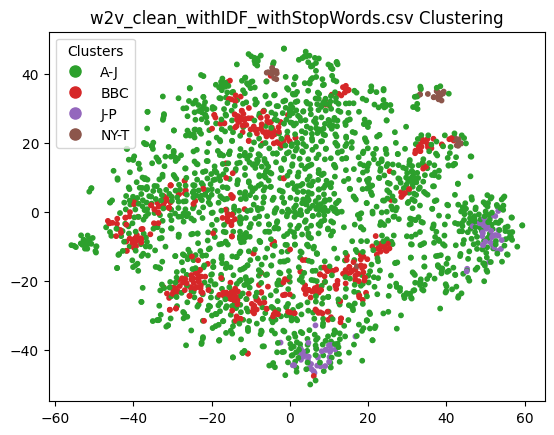

---------------w2v_clean_withoutIdf_withoutStopWords.csv---------------
Precision: 0.259533711405167
Recall: 0.2881481278755424
F1 Score: 0.10300563662364712
Accuracy: 0.11167945439045183


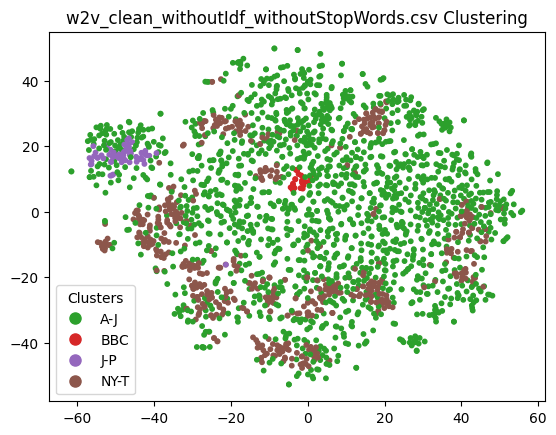

---------------w2v_clean_withoutIdf_withStopWords.csv---------------
Precision: 0.44002574002574
Recall: 0.20940973267528457
F1 Score: 0.00898416449032044
Accuracy: 0.011935208866155157


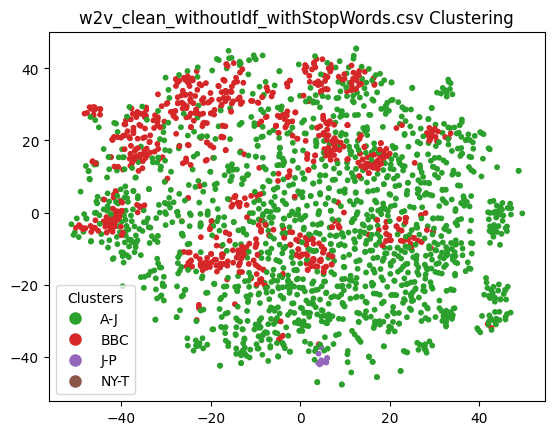

---------------w2v_lemma_withIDF_withoutStopWords.csv---------------
Precision: 0.08855115062011613
Recall: 0.7147024499989825
F1 Score: 0.03346590662110433
Accuracy: 0.06862745098039216


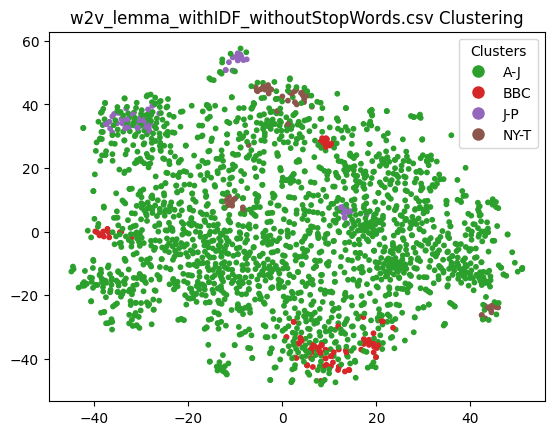

---------------w2v_lemma_withIDF_withStopWords.csv---------------
Precision: 0.09046231546231547
Recall: 0.6739247202587744
F1 Score: 0.04679912449994914
Accuracy: 0.09718670076726342


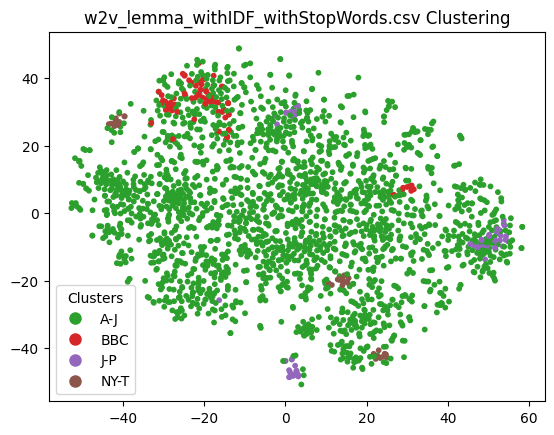

---------------w2v_lemma_withoutIdf_withoutStopWords.csv---------------
Precision: 0.4997329443061872
Recall: 0.3013535005215128
F1 Score: 0.12227338383079651
Accuracy: 0.12745098039215685


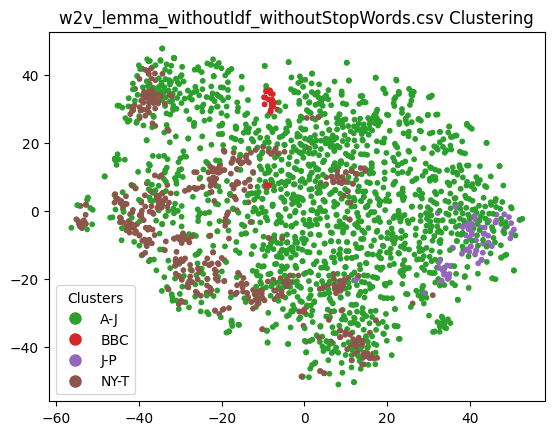

---------------w2v_lemma_withoutIdf_withStopWords.csv---------------
Precision: 0.6085333333333333
Recall: 0.21432746137308384
F1 Score: 0.016644145070024704
Accuracy: 0.017902813299232736


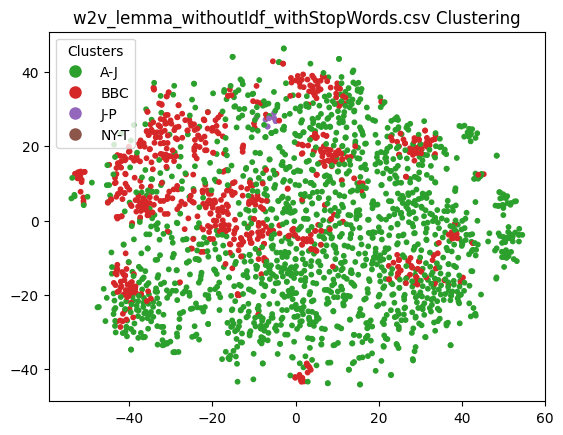

In [60]:
process_all_matrices(calc_dbscan)

Gaussian

In [64]:
from sklearn.mixture import GaussianMixture

def calc_gaussian(X, y_true, name):
    """
    Perform clustering using Gaussian Mixture Models (GMM) with cosine similarity,
    evaluate the clustering results, and visualize the clusters using t-SNE.

    Parameters:
    ----------
    X : ndarray
        The input feature matrix (n_samples x n_features).
    y_true : ndarray
        The ground truth labels for evaluation.
    name : str
        The name of the dataset or clustering task for visualization purposes.

    Process:
    -------
    1. Calculate cosine similarity between samples to generate a similarity matrix.
    2. Fit a Gaussian Mixture Model (GMM) to the similarity matrix.
    3. Predict the cluster labels for each sample using the trained GMM.
    4. Evaluate the clustering results using:
       - Precision
       - Recall
       - F1 Score
       - Accuracy
    5. Visualize the clusters using t-SNE for dimensionality reduction.
    6. Assign distinct colors to each cluster and add a legend with custom cluster labels.

    Notes:
    ------
    - The number of clusters (`n_components`) is predefined as 4.
    - Ensure that `labels_list` is defined and matches the expected cluster IDs.
    - Noise handling is not explicitly included since GMM assigns all samples to clusters.

    Returns:
    -------
    None
        The function does not return any values but prints evaluation metrics and displays a t-SNE visualization.

    Example Usage:
    --------------
    labels_list = {'A-J': 0, 'BBC': 1, 'J-P': 2, 'NY-T': 3}
    calc_gaussian(X, y_true, "My Dataset")
    """
    # Step 1: Define the number of clusters
    n_components = 4

    # Step 2: Calculate cosine similarity matrix
    similarity_matrix = cosine_similarity(X)

    # Step 3: Fit Gaussian Mixture Model (GMM)
    gm = GaussianMixture(n_components=n_components, random_state=0).fit(similarity_matrix)

    # Step 4: Predict cluster labels using the trained GMM
    y_pred_gm = gm.predict(similarity_matrix)

    # Step 5: Evaluate clustering results
    precision = precision_score(y_true, y_pred_gm, average='macro', zero_division=1)
    recall = recall_score(y_true, y_pred_gm, average='macro', zero_division=1)
    f1 = f1_score(y_true, y_pred_gm, average='macro', zero_division=1)
    accuracy = accuracy_score(y_true, y_pred_gm)

    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1 Score: {f1:.4f}")
    print(f"Accuracy: {accuracy:.4f}")

    # Step 6: Visualize clusters using t-SNE
    tsne = TSNE(n_components=2, random_state=42)
    embedding_tsne = tsne.fit_transform(X)

    # Define distinct colors for clusters
    distinct_colors = ['#2ca02c', '#d62728', '#9467bd', '#8c564b']
    cmap = ListedColormap(distinct_colors[:len(set(y_pred_gm))])

    plt.figure(figsize=(8, 6))
    plt.scatter(
        embedding_tsne[:, 0], 
        embedding_tsne[:, 1], 
        c=y_pred_gm, 
        cmap=cmap, 
        s=10
    )
    plt.title(f'{name} Clustering')
    plt.xlabel('t-SNE Dimension 1')
    plt.ylabel('t-SNE Dimension 2')

    # Step 7: Add legend with custom cluster labels
    cluster_labels = labels_list.keys()
    handles = [
        plt.Line2D([0], [0], marker='o', color=distinct_colors[i % len(distinct_colors)], 
                   linestyle='', markersize=8, label=label)
        for i, label in enumerate(cluster_labels)
    ]
    plt.legend(handles=handles, title="Clusters")
    plt.show()


---------------bert_withIDF.csv---------------
Precision: 0.2656
Recall: 0.1557
F1 Score: 0.1855
Accuracy: 0.1590


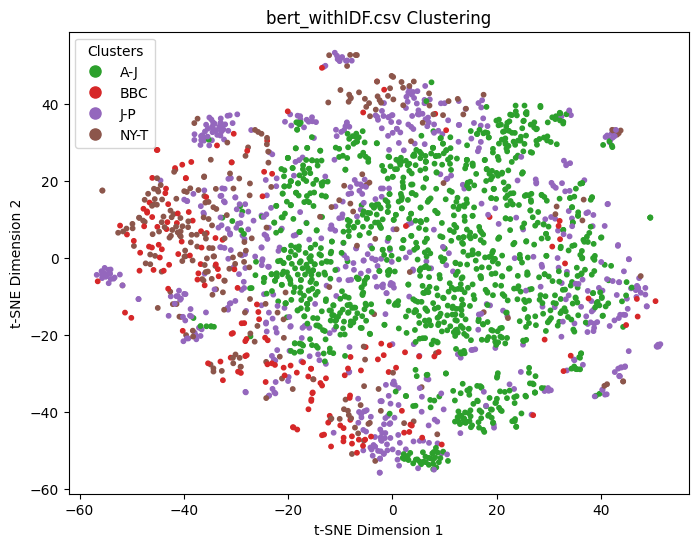

---------------bert_withoutIDF.csv---------------
Precision: 0.0379
Recall: 0.0322
F1 Score: 0.0337
Accuracy: 0.0328


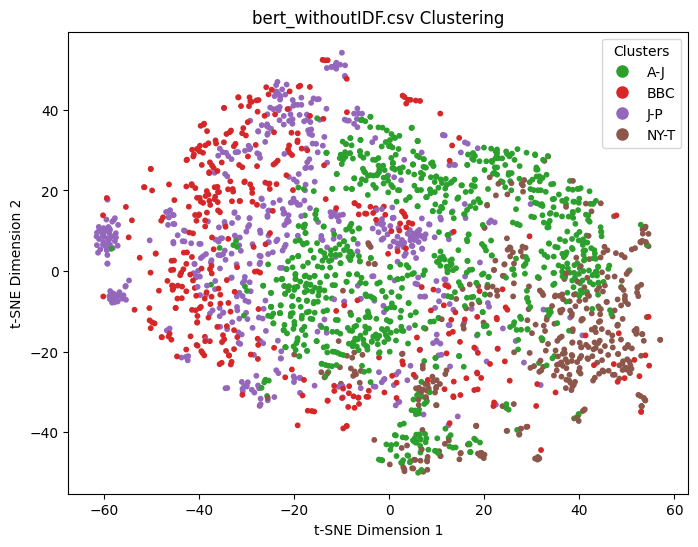

---------------sbert_vectors.csv---------------
Precision: 0.3437
Recall: 0.3093
F1 Score: 0.3041
Accuracy: 0.3129


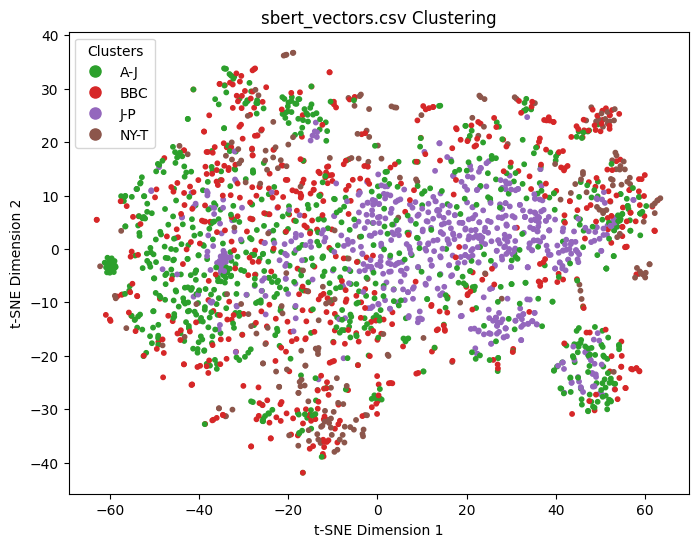

---------------doc2vec_vectors.csv---------------
Precision: 0.3994
Recall: 0.3524
F1 Score: 0.3725
Accuracy: 0.3572


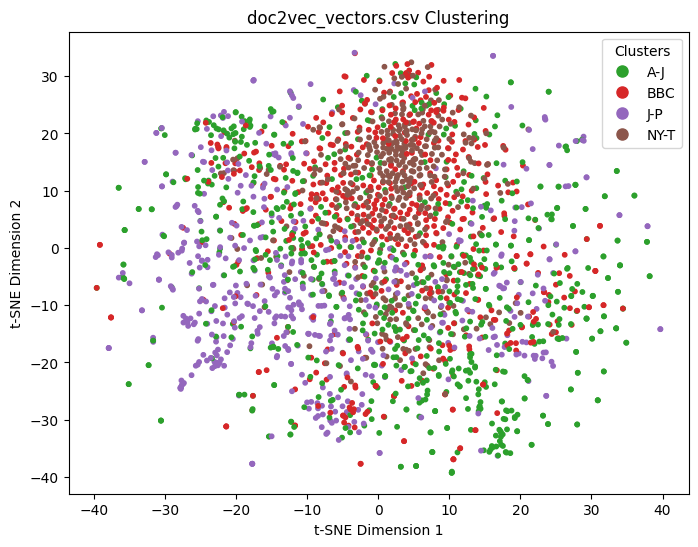

---------------glove_clean_withIDF_withoutStopWords.csv---------------
Precision: 0.1127
Recall: 0.1345
F1 Score: 0.1155
Accuracy: 0.1373


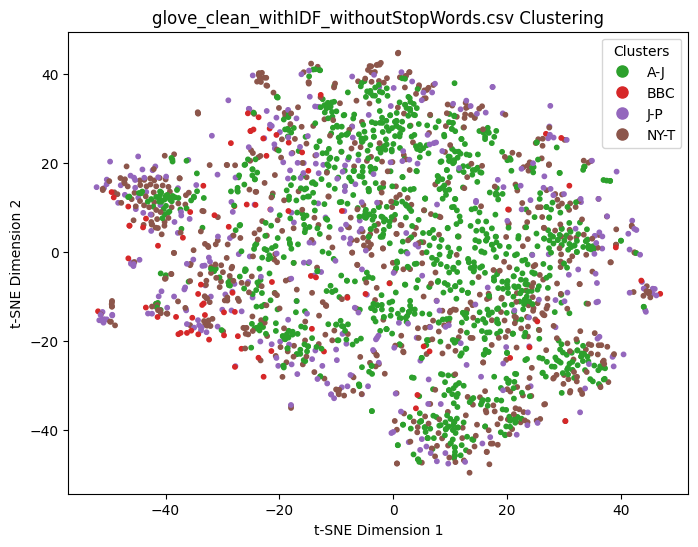

---------------glove_clean_withIDF_withStopWords.csv---------------
Precision: 0.2092
Recall: 0.1778
F1 Score: 0.1802
Accuracy: 0.1795


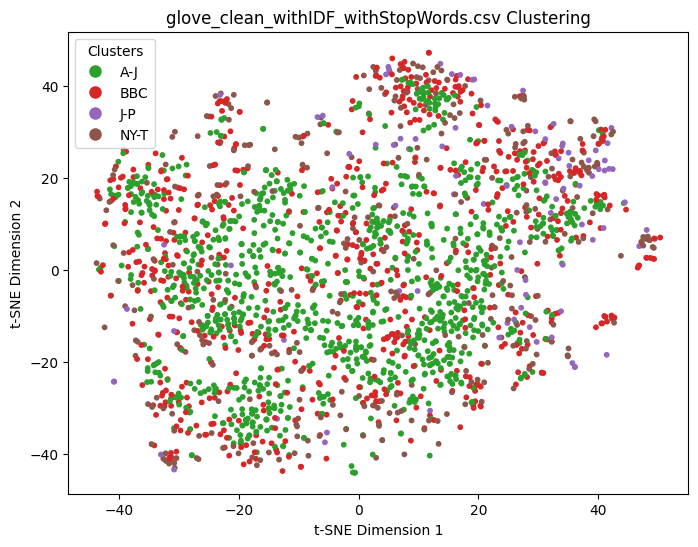

---------------glove_clean_withoutIdf_withoutStopWords.csv---------------
Precision: 0.1095
Recall: 0.1390
F1 Score: 0.1146
Accuracy: 0.1419


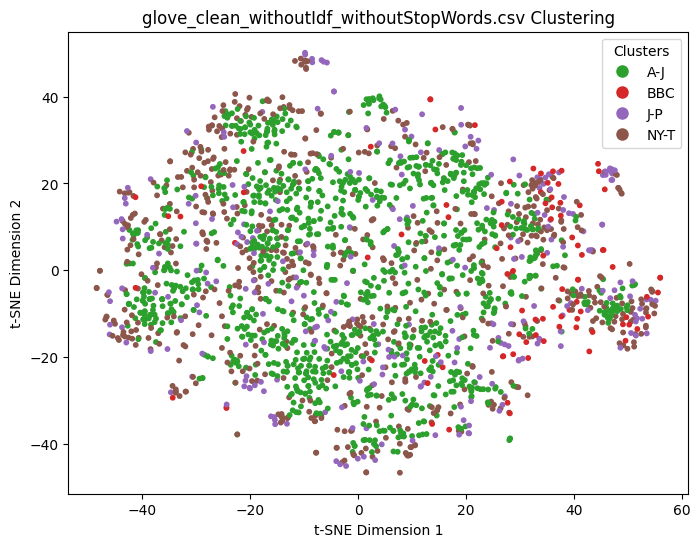

---------------glove_clean_withoutIdf_withStopWords.csv---------------
Precision: 0.0539
Recall: 0.0777
F1 Score: 0.0614
Accuracy: 0.0793


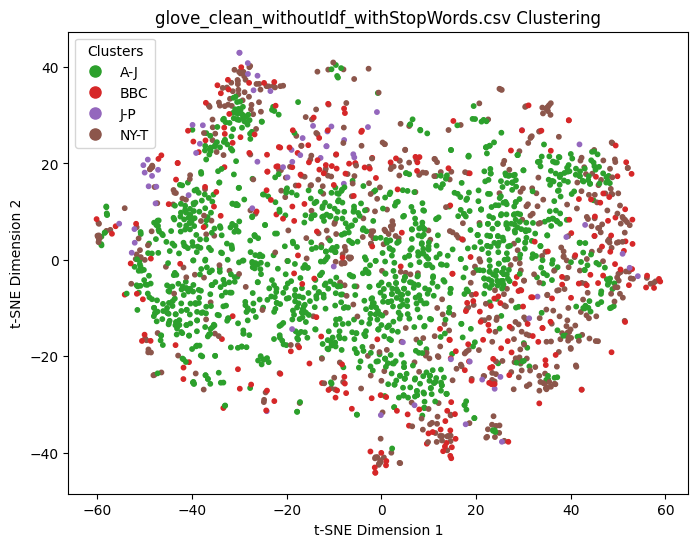

---------------glove_lemma_withIDF_withoutStopWords.csv---------------
Precision: 0.1098
Recall: 0.1307
F1 Score: 0.1139
Accuracy: 0.1334


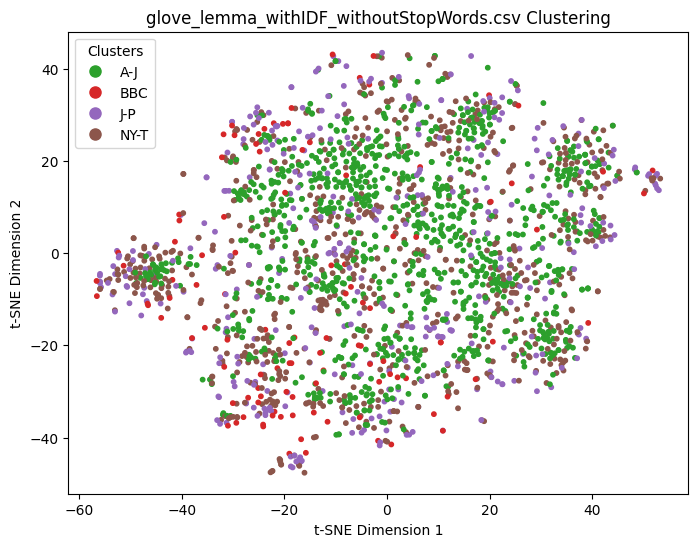

---------------glove_lemma_withIDF_withStopWords.csv---------------
Precision: 0.2317
Recall: 0.2150
F1 Score: 0.2125
Accuracy: 0.2195


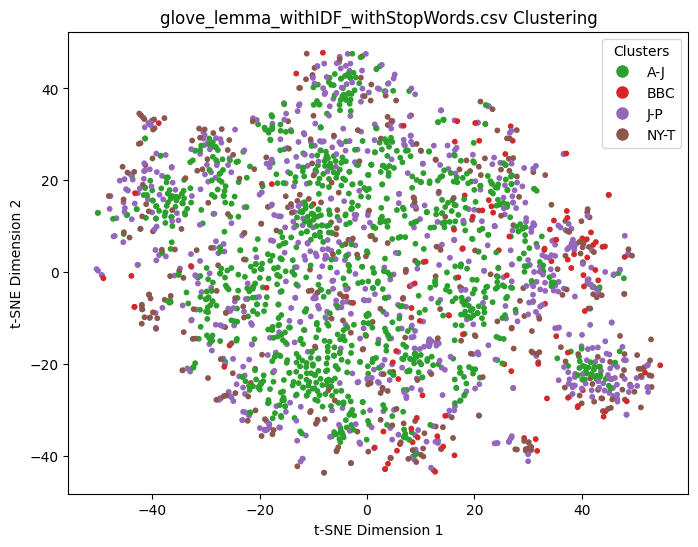

---------------glove_lemma_withoutIdf_withoutStopWords.csv---------------
Precision: 0.3109
Recall: 0.1490
F1 Score: 0.1392
Accuracy: 0.1522


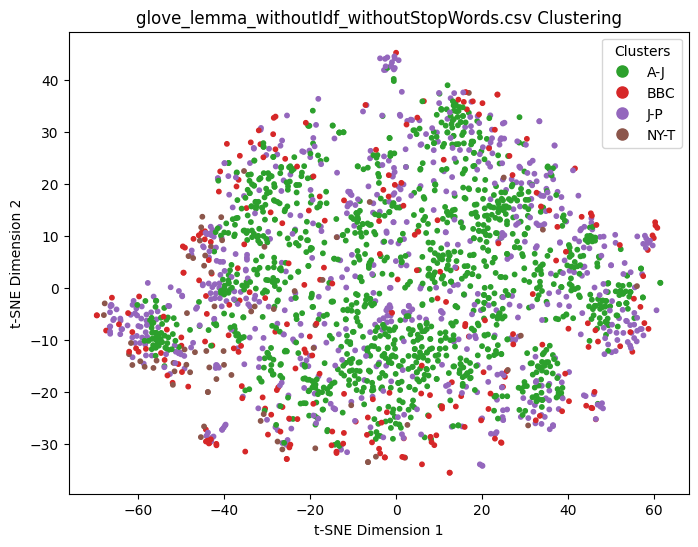

---------------glove_lemma_withoutIdf_withStopWords.csv---------------
Precision: 0.0648
Recall: 0.0877
F1 Score: 0.0700
Accuracy: 0.0895


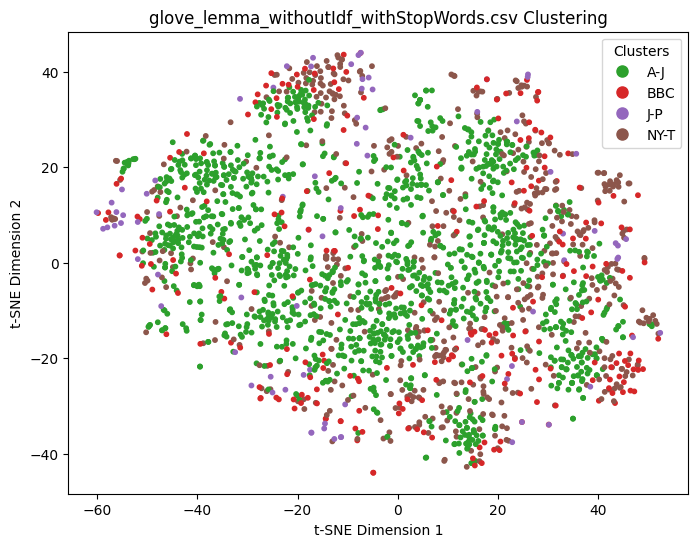

---------------TF-IDF clean---------------
Precision: 0.0493
Recall: 0.0426
F1 Score: 0.0457
Accuracy: 0.0435


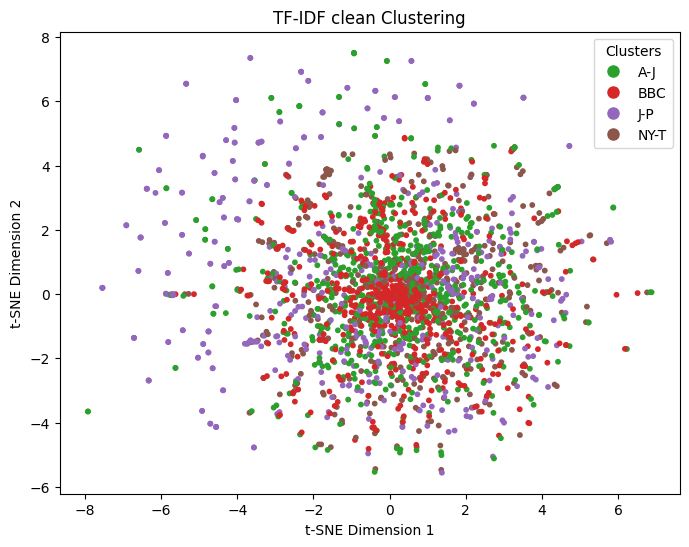

---------------TF-IDF lemma---------------
Precision: 0.3232
Recall: 0.3183
F1 Score: 0.3193
Accuracy: 0.3240


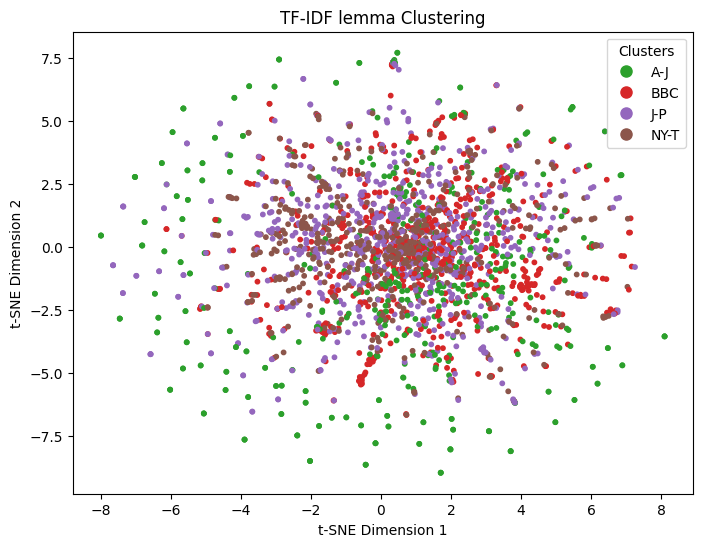

---------------w2v_clean_withIDF_withoutStopWords.csv---------------
Precision: 0.2706
Recall: 0.3147
F1 Score: 0.2856
Accuracy: 0.3214


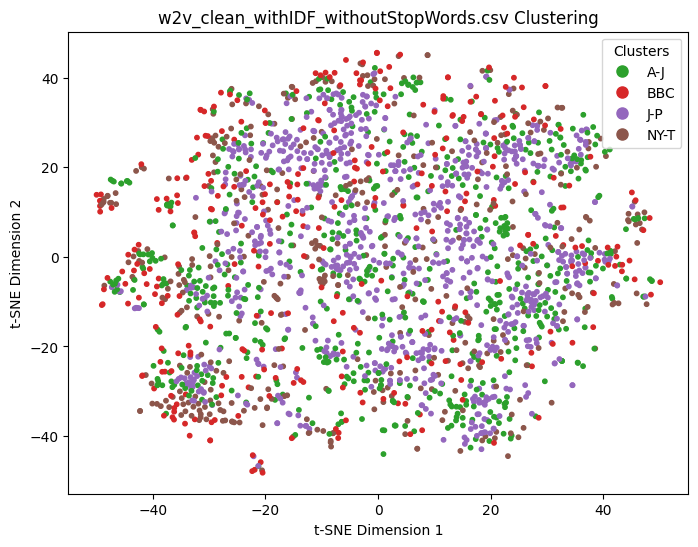

---------------w2v_clean_withIDF_withStopWords.csv---------------
Precision: 0.1626
Recall: 0.1893
F1 Score: 0.1732
Accuracy: 0.1931


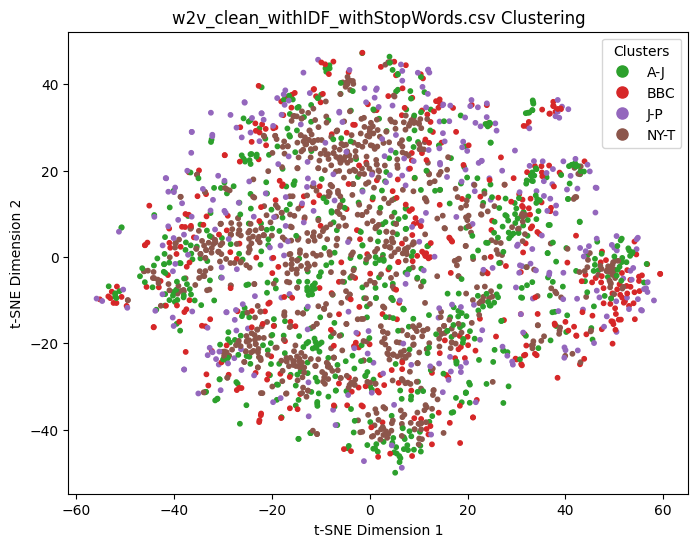

---------------w2v_clean_withoutIdf_withoutStopWords.csv---------------
Precision: 0.2202
Recall: 0.1861
F1 Score: 0.1966
Accuracy: 0.1901


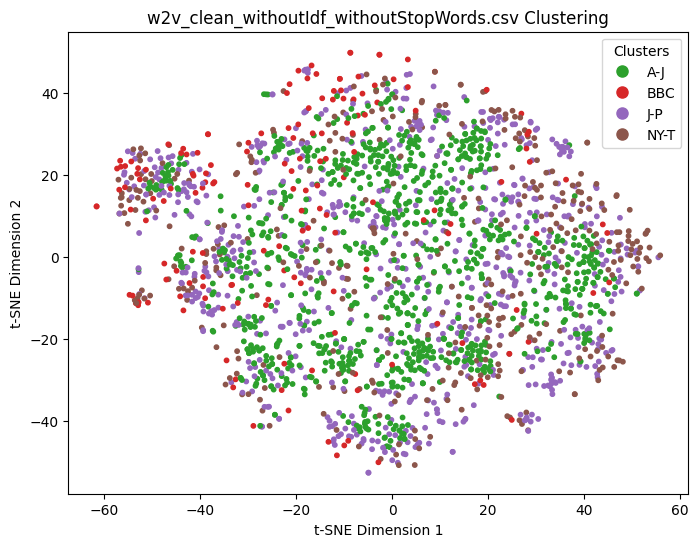

---------------w2v_clean_withoutIdf_withStopWords.csv---------------
Precision: 0.4905
Recall: 0.5075
F1 Score: 0.4617
Accuracy: 0.5183


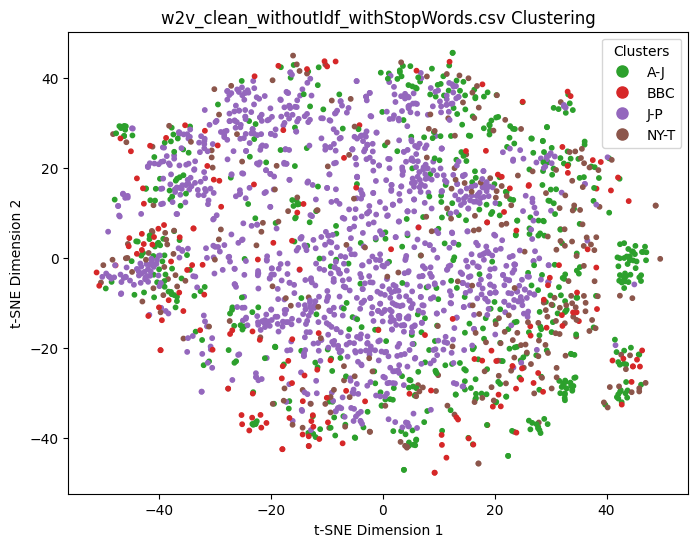

---------------w2v_lemma_withIDF_withoutStopWords.csv---------------
Precision: 0.0449
Recall: 0.0401
F1 Score: 0.0416
Accuracy: 0.0409


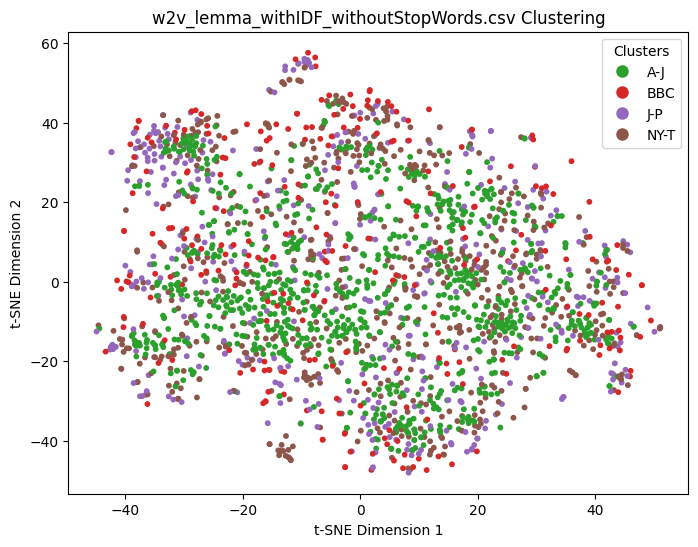

---------------w2v_lemma_withIDF_withStopWords.csv---------------
Precision: 0.1669
Recall: 0.1465
F1 Score: 0.1538
Accuracy: 0.1496


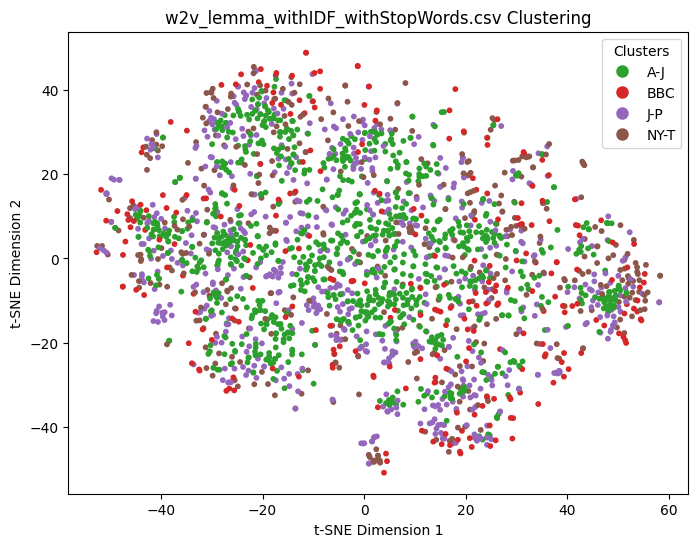

---------------w2v_lemma_withoutIdf_withoutStopWords.csv---------------
Precision: 0.0458
Recall: 0.0459
F1 Score: 0.0441
Accuracy: 0.0469


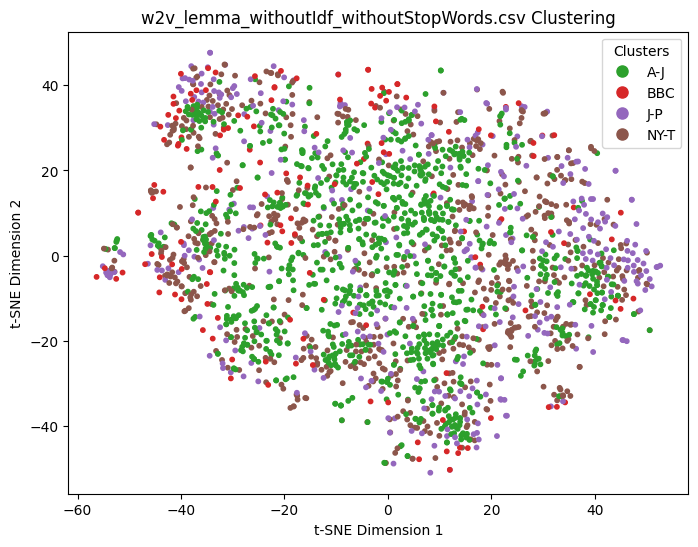

---------------w2v_lemma_withoutIdf_withStopWords.csv---------------
Precision: 0.2909
Recall: 0.1215
F1 Score: 0.1519
Accuracy: 0.1240


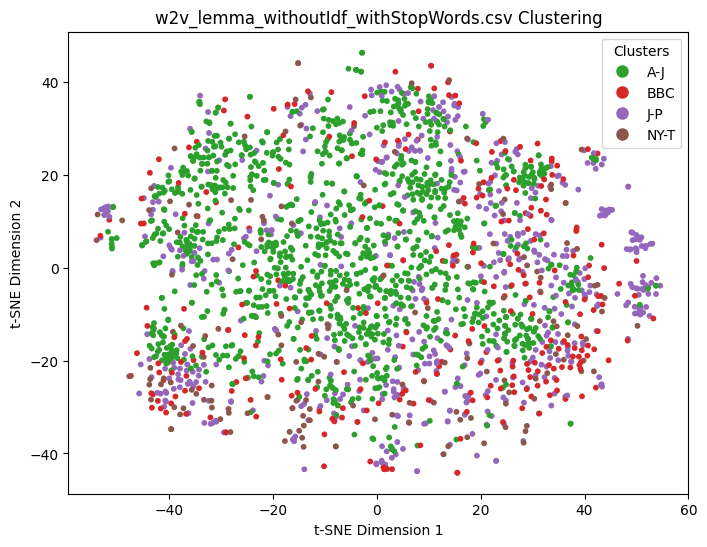

In [65]:
process_all_matrices(calc_gaussian)

In [69]:
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler

In [70]:

# Define classifiers
classifiers = {
    "Naive Bayes (NB)": GaussianNB(),
    "Support Vector Machine (SVM)": SVC(kernel='linear', random_state=42),
    "Logistic Regression (LoR)": LogisticRegression(random_state=42, max_iter=1000),
    "Random Forest (RF)": RandomForestClassifier(random_state=42, n_estimators=100),
}

In [68]:

def compare_classifiers(X, y, dataset_name):
    """
    Compare multiple classifiers using 10-fold cross-validation.

    Parameters:
    ----------
    X : ndarray
        Feature matrix (n_samples x n_features).
    y : ndarray
        Target labels (n_samples).
    dataset_name : str
        Name of the dataset or task for identification in output.

    Process:
    -------
    1. Standardize the input features using StandardScaler.
    2. Perform 10-fold stratified cross-validation for each classifier.
    3. Calculate the mean accuracy and standard deviation for each classifier.

    Notes:
    ------
    - The `classifiers` dictionary includes:
        - Naive Bayes
        - Support Vector Machine (linear kernel)
        - Logistic Regression
        - Random Forest
    - Results are printed to the console.

    Returns:
    -------
    None
        The function outputs evaluation results for each classifier.

    Example Usage:
    --------------
    compare_classifiers(X, y, "My Dataset")
    """
    # Step 1: Standardize the features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    print(f"Evaluation Results for {dataset_name}:")

    # Step 2: Perform 10-fold cross-validation
    cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

    # Step 3: Evaluate each classifier
    for clf_name, clf in classifiers.items():
        scores = cross_val_score(clf, X_scaled, y, cv=cv, scoring='accuracy')
        print(f"{clf_name}: Mean Accuracy = {scores.mean():.4f} ± {scores.std():.4f}")


In [71]:
process_all_matrices(compare_classifiers)

---------------bert_withIDF.csv---------------
Evaluation Results for bert_withIDF.csv:
Naive Bayes (NB): Mean Accuracy = 0.7980 ± 0.0201
Support Vector Machine (SVM): Mean Accuracy = 0.9732 ± 0.0093
Logistic Regression (LoR): Mean Accuracy = 0.9732 ± 0.0081
Random Forest (RF): Mean Accuracy = 0.9518 ± 0.0128
---------------bert_withoutIDF.csv---------------
Evaluation Results for bert_withoutIDF.csv:
Naive Bayes (NB): Mean Accuracy = 0.8564 ± 0.0252
Support Vector Machine (SVM): Mean Accuracy = 0.9731 ± 0.0072
Logistic Regression (LoR): Mean Accuracy = 0.9744 ± 0.0069
Random Forest (RF): Mean Accuracy = 0.9612 ± 0.0143
---------------sbert_vectors.csv---------------
Evaluation Results for sbert_vectors.csv:
Naive Bayes (NB): Mean Accuracy = 0.6696 ± 0.0229
Support Vector Machine (SVM): Mean Accuracy = 0.8265 ± 0.0152
Logistic Regression (LoR): Mean Accuracy = 0.8321 ± 0.0131
Random Forest (RF): Mean Accuracy = 0.8986 ± 0.0164
---------------doc2vec_vectors.csv---------------
Evaluatio